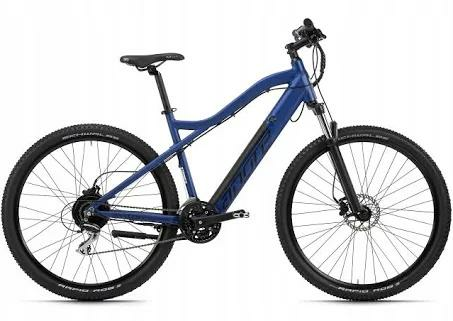

In [57]:
import tensorflow as tf
image = tf.io.read_file(r'crawlers\fahrrad_google\images\0a1e0b49-b51c-4722-9204-2a2cbfb97af40_1229.99.jpg')
image = tf.image.decode_jpeg(image, channels=3)

import PIL
# show image
PIL.Image.fromarray(image.numpy())

In [54]:
from PIL import Image

with Image.open(r'crawlers\fahrrad_google\images\0a1e0b49-b51c-4722-9204-2a2cbfb97af40_1229.99.jpg') as img:
    print( img.format)

JPEG


In [2]:
import os

def check_for_unicode_error(directory):
    for dirpath, dirnames, filenames in os.walk(directory):
        for filename in filenames:
            try:
                with open(os.path.join(dirpath, filename), 'r', encoding='utf-8') as f:
                    f.read()
            except UnicodeDecodeError as e:
                print(f"UnicodeDecodeError: {e} occurred while trying to read file: {os.path.join(dirpath, filename)}")

check_for_unicode_error('crawlers/fahrrad_google/images')

UnicodeDecodeError: 'utf-8' codec can't decode byte 0xff in position 0: invalid start byte occurred while trying to read file: crawlers/fahrrad_google/images\0000378f-0cb2-4e8c-9dff-d9d80eb49caf0_599.00.jpg
UnicodeDecodeError: 'utf-8' codec can't decode byte 0xff in position 0: invalid start byte occurred while trying to read file: crawlers/fahrrad_google/images\000330ac-fa4d-4fb0-b279-876f5796d24a0_439.90.jpg
UnicodeDecodeError: 'utf-8' codec can't decode byte 0xff in position 0: invalid start byte occurred while trying to read file: crawlers/fahrrad_google/images\0005abbb-8c98-4c46-9061-260c2386a0c20_580.95.jpg
UnicodeDecodeError: 'utf-8' codec can't decode byte 0xff in position 0: invalid start byte occurred while trying to read file: crawlers/fahrrad_google/images\00062927-48d7-4f41-a88b-e50b6100ca6d0_4599.00.jpg
UnicodeDecodeError: 'utf-8' codec can't decode byte 0xff in position 0: invalid start byte occurred while trying to read file: crawlers/fahrrad_google/images\000d891e-00ea

In [8]:
# keras image dataset from directory
dataset = tf.keras.preprocessing.image_dataset_from_directory('crawlers/fahrrad_google/images')

UnicodeDecodeError: 'utf-8' codec can't decode byte 0xa0 in position 146: invalid start byte

In [3]:
import os
import tensorflow as tf 

def get_dataset_path_and_labels(dataset_path):
    labels = []
    files = []
  
    for file in os.listdir(dataset_path):
        print(file) 
        label = file.split('_')[-1].replace('.jpg','').replace('ÿ','').replace('ÿ','').replace('ab','').strip()
        labels.append(str(os.path.join(dataset_path, file)))
        files.append(os.path.join(dataset_path, file))
    return files, labels

def load_and_preprocess_image(path, label):
    # use pil to load image
   
   

    
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)


    image = tf.image.resize(image, [299, 299])
   


    '''  # Flip the image horizontally
    flipped_image = tf.image.flip_left_right(image) '''

   
    
    # Add the augmented images to the dataset
    ''' images = tf.stack([image, flipped_image])
    labels = tf.stack([label, label, label]) '''
    return image, label

def get_dataset(dataset_path):
    files, labels = get_dataset_path_and_labels(dataset_path)
    ds = tf.data.Dataset.from_tensor_slices((files, labels))
    ds = ds.map(load_and_preprocess_image)
    
    
    return ds


dataset = get_dataset('data/bicycles_all')


0000378f-0cb2-4e8c-9dff-d9d80eb49caf0_599.00.jpg
000330ac-fa4d-4fb0-b279-876f5796d24a0_439.90.jpg
0005abbb-8c98-4c46-9061-260c2386a0c20_580.95.jpg
000602e6-d952-471f-872e-a0533ef303fa_2799.jpg
00060ef2-3679-4a92-a36a-2a43675b865b_759.jpg
00062927-48d7-4f41-a88b-e50b6100ca6d0_4599.00.jpg
00091a-14f1-4c47-948c-f3e4f5667436_2199.jpg
000d891e-00ea-4faf-92a9-3d73bf476dde0_1060.26.jpg
0017230c-a5d8-47ef-ad8a-b75247e9e41a0_999.00.jpg
001842f3-0aa9-4fa1-80c2-bfa6cd727436_6199.jpg
0018cf5b-2d44-48c3-a411-f9e934a914ed0_399.99.jpg
00197b17-fe2f-4c2d-b76a-356e5ec3732c_2499.jpg
001b4971-0174-4b04-9a54-d58240d89c80_2499.jpg
00205e23-3ad8-4d5d-a16b-26859036fd950_249.00.jpg
0025dcb6-511d-40b8-a104-92b030b8e52d0_692.17.jpg
00276b60-d59b-4184-5d-a85c64e1cce1_2699.jpg
002ab31d-d463-42b4-96b0-1bd118c264340_1249.00.jpg
002bd292-2b12-460b-90b2-abfbf59f910a0_999.00.jpg
002c640e-d98b-435a-90c8-f4c7ba80de030_2399.00.jpg
002fe216-f0e5-4a53-813a-48b24e03a440_3699.jpg
0030057e-c5e9-4767-ab01-689345e4d3510_6750.00

In [4]:
len(dataset)

37867

In [5]:

i = tf.keras.layers.Input([None, None, 3], dtype = tf.uint8)
x = tf.cast(i, tf.float32)
x = tf.keras.applications.inception_resnet_v2.preprocess_input(x)
core = tf.keras.applications.InceptionResNetV2(weights='imagenet')
x = core(x)
model = tf.keras.Model(inputs=[i], outputs=[x])

In [64]:
dataset

<_MapDataset element_spec=(TensorSpec(shape=(299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.float32, name=None))>

In [170]:
X,Y = [],[]

In [171]:


# image = tf.image.decode_png(tf.io.read_file(r'crawlers\fahrrad_google\images\0a1e0b49-b51c-4722-9204-2a2cbfb97af40_1229.99.jpg'))
# # resize imaeg
# image = tf.image.resize(image, [299, 299])
# image = tf.expand_dims(image, axis=0)

for batch in dataset.batch(200):
    predictions = model(batch[0])
    top_10 = tf.keras.applications.inception_resnet_v2.decode_predictions(predictions.numpy(), top=10)
    X.extend(top_10)
    Y.extend([x.numpy().decode('utf-8')for x in batch[1]])
    # process predictions
    print(len(Y))

# get top 5 predictions

# get top 5 predictions


200
400
600
800
1000
1200
1400
1600
1800
2000
2200
2400
2600
2800
3000
3200
3400
3600
3800
4000
4200
4400
4600
4800
5000
5200
5400
5600


KeyboardInterrupt: 

In [194]:
non_bike = [
    r"C:\Users\amos\Documents\Programmieren\DataScience\BikePricePredict\crawlers\fahrrad_google\images\90a7243e-e3db-44c9-a4dc-7b6ab2ff71740_250.00.jpg",
    r"C:\Users\amos\Documents\Programmieren\DataScience\BikePricePredict\crawlers\fahrrad_google\images\b6a9f267-d616-40c0-b7b1-4f16cb9c813e0_3699.99.jpg",
    r"C:\Users\amos\Documents\Programmieren\DataScience\BikePricePredict\crawlers\fahrrad_google\images\6a923b97-63a7-4c8e-a251-4e389ac0617e0_2395.00.jpg",
    r"C:\Users\amos\Documents\Programmieren\DataScience\BikePricePredict\crawlers\fahrrad_google\images\ba9273d4-06e1-48d9-ae8c-ebd84c9a0d850_529.00.jpg",
    r"C:\Users\amos\Documents\Programmieren\DataScience\BikePricePredict\crawlers\fahrrad_google\images\3b441e0f-1609-4a9e-9b56-04734a000d6d0_379.00.jpg",
    r"C:\Users\amos\Documents\Programmieren\DataScience\BikePricePredict\crawlers\fahrrad_google\images\3e075e58-d2ce-4c6e-981b-cac41e9df1170_249.99.jpg",
    r"C:\Users\amos\Documents\Programmieren\DataScience\BikePricePredict\crawlers\fahrrad_google\images\da19f5fb-8f00-47be-9a58-2a5a6f4457ce0_240.00.jpg",
    r"C:\Users\amos\Documents\Programmieren\DataScience\BikePricePredict\crawlers\fahrrad_google\images\fe60286b-f21d-47d4-8761-ba7015a0acf30_229.00.jpg",
    r"C:\Users\amos\Documents\Programmieren\DataScience\BikePricePredict\crawlers\fahrrad_google\images\5e8c52a8-0d6f-4939-8624-996d7353614d0_209.79.jpg",
    r"C:\Users\amos\Documents\Programmieren\DataScience\BikePricePredict\crawlers\fahrrad_google\images\19568fa9-cc44-45ea-a730-33aeb4a4e1160_499.00.jpg",
    r"C:\Users\amos\Documents\Programmieren\DataScience\BikePricePredict\crawlers\fahrrad_google\images\38bdb056-f2f3-40d4-a946-d8e3ccfac6cc0_3999.00.jpg",
    r"C:\Users\amos\Documents\Programmieren\DataScience\BikePricePredict\crawlers\fahrrad_google\images\ef613213-c2e2-48fc-946f-9d8ac65ed2310_3096.95.jpg", # stange kleiner ausschnitt
    r"C:\Users\amos\Documents\Programmieren\DataScience\BikePricePredict\crawlers\fahrrad_google\images\76ef57ed-baea-4a42-b51d-8687dbcc645c0_80.00.jpg"


]
close = [
    r"C:\Users\amos\Documents\Programmieren\DataScience\BikePricePredict\crawlers\fahrrad_google\images\df8d7307-7022-4fc6-a81e-3af515c698ad0_290.00.jpg", #jumping guy with bike
    r"C:\Users\amos\Documents\Programmieren\DataScience\BikePricePredict\crawlers\fahrrad_google\images\ed730f8d-4777-4a05-83ee-93f9799216060_298.35.jpg", #rahmen
    r"C:\Users\amos\Documents\Programmieren\DataScience\BikePricePredict\crawlers\fahrrad_google\images\b999baf3-f7eb-447e-8a6c-ec4f6d19e2930_206.45.jpg", #rahmen vorne lenkung
]

In [192]:
# get predictions for paths in non_bike
for path in non_bike:
    image = tf.image.decode_png(tf.io.read_file(path))
    # resize imaeg
    image = tf.image.resize(image, [299, 299])
    image = tf.expand_dims(image, axis=0)
    predictions = model(image)
    top_10 = tf.keras.applications.inception_resnet_v2.decode_predictions(predictions.numpy(), top=10)
    print(top_10)
    

[[('n03785016', 'moped', 0.4593522), ('n04482393', 'tricycle', 0.21219002), ('n03791053', 'motor_scooter', 0.17750728), ('n02835271', 'bicycle-built-for-two', 0.008732478), ('n04509417', 'unicycle', 0.005723511), ('n03792782', 'mountain_bike', 0.0040192655), ('n03425413', 'gas_pump', 0.0031649373), ('n02747177', 'ashcan', 0.0027853176), ('n03599486', 'jinrikisha', 0.0024728207), ('n03208938', 'disk_brake', 0.00242741)]]
[[('n03109150', 'corkscrew', 0.54414004), ('n02951585', 'can_opener', 0.24195513), ('n04552348', 'warplane', 0.027804228), ('n04592741', 'wing', 0.012662232), ('n04228054', 'ski', 0.0059485086), ('n03141823', 'crutch', 0.0055767302), ('n04482393', 'tricycle', 0.005073469), ('n03476684', 'hair_slide', 0.0047634705), ('n02879718', 'bow', 0.0047581377), ('n02690373', 'airliner', 0.004642648)]]
[[('n03967562', 'plow', 0.92577547), ('n03496892', 'harvester', 0.012073305), ('n03532672', 'hook', 0.009098021), ('n03649909', 'lawn_mower', 0.004726363), ('n03126707', 'crane', 0.0

In [195]:
from pathlib import Path
Y_paths = [Path(x).name for x in Y]
non_bikes = [Path(x).name for x in non_bike]

# get index, try
for i in range(len(Y_paths)):
    if Y_paths[i] in non_bikes:
        print(i)



746
1670
1747
1818
2806
3139
3516
5472


In [189]:
X[5439]

[('n04041544', 'radio', 0.29072812),
 ('n04154565', 'screwdriver', 0.20179635),
 ('n02966687', "carpenter's_kit", 0.11743616),
 ('n03759954', 'microphone', 0.116201945),
 ('n04208210', 'shovel', 0.02881794),
 ('n04228054', 'ski', 0.013403555),
 ('n04317175', 'stethoscope', 0.012859703),
 ('n03532672', 'hook', 0.0107518025),
 ('n03976657', 'pole', 0.007825826),
 ('n03777754', 'modem', 0.007625926)]

2614


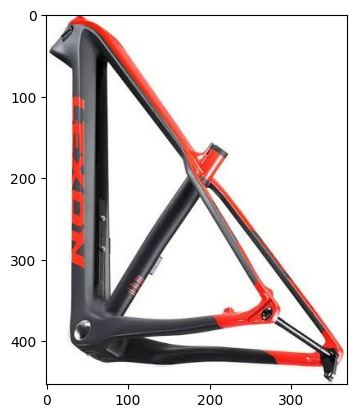

3137


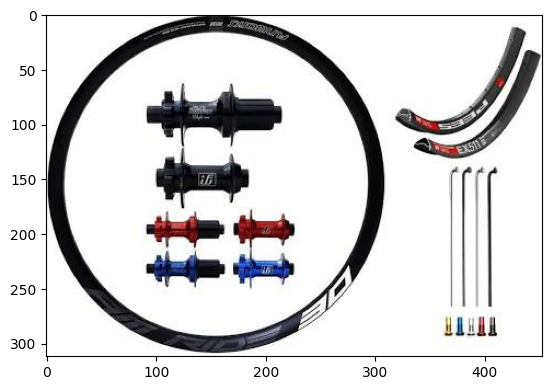

3299


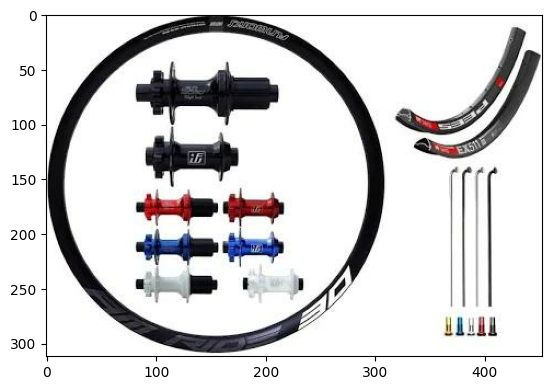

3693


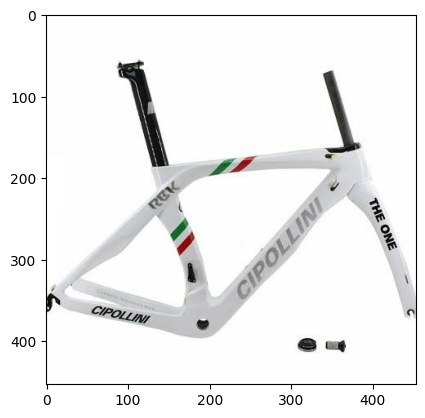

4523


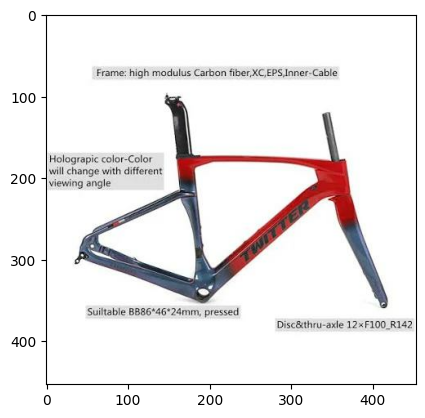

4810


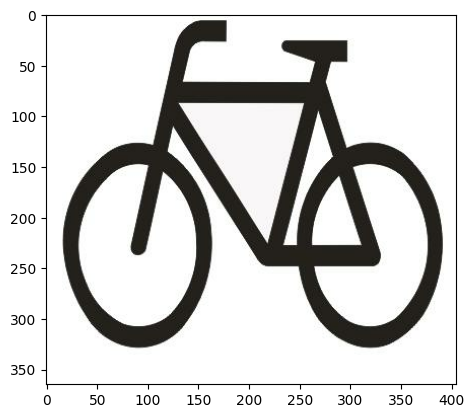

In [205]:
# show images where first prediction is moped
for i in range(len(X)):
    if X[i][0][1] == 'hook':
        print(i)
        # print(X[i])
        # print(Y[i])
        # print('------------------')
        # show image with matplotlib
        image = tf.image.decode_png(tf.io.read_file(Y[i]))
        
        plt.imshow(image)

        plt.show()


In [178]:
import pandas as pd
# count top 1 predictions
top_1 = [x[0][1] for x in X]
top_1 = pd.Series(top_1)
top_1.value_counts()


mountain_bike            4681
bicycle-built-for-two     375
tricycle                  278
moped                     180
disk_brake                 16
hook                        6
stretcher                   4
tripod                      3
stopwatch                   3
crash_helmet                3
rule                        2
alp                         2
folding_chair               2
car_wheel                   2
coil                        2
parallel_bars               2
cellular_telephone          1
reel                        1
conch                       1
cocktail_shaker             1
go-kart                     1
letter_opener               1
ashcan                      1
breastplate                 1
electric_fan                1
running_shoe                1
gong                        1
magnetic_compass            1
perfume                     1
hard_disc                   1
radiator                    1
soap_dispenser              1
radio                       1
plow      

In [216]:
# save all predictions with top prediction bicycle in list, only their probability and index
bicycle = []
ybicycle = []
for i in range(len(X)):
    if X[i][0][1] == 'mountain_bike':
        ybicycle.append(Y[i])
        bicycle.append(X[i][0][2])



In [217]:
# sort bicycle and ybicycle by bicycle
bicycle, ybicycle = zip(*sorted(zip(bicycle, ybicycle)))


In [197]:
import pandas as pd
# count top 1 predictions
top_1 = [x[1][1] for x in X]
top_1 = pd.Series(top_1)
top_1.value_counts()


disk_brake               3102
bicycle-built-for-two    1507
tricycle                  432
mountain_bike             287
moped                     159
                         ... 
piggy_bank                  1
motor_scooter               1
bassinet                    1
crate                       1
water_jug                   1
Name: count, Length: 65, dtype: int64

### only keep 
mountain_bike            4681
bicycle-built-for-two     375
tricycle                  278
moped

save to data/bicycle_google_keep
save to data/bicycle_google_remove to check

In [5]:
import os
import tensorflow as tf
from pathlib import Path
def get_dataset_path_and_labels(dataset_path, filter_out_filenames):
    labels = []
    files = []
  
    for file in os.listdir(dataset_path):
        print(file) 
        # label = file.split('_')[-1].replace('.jpg','').replace('ÿ','').replace('ÿ','').replace('ab','').strip()
        if file in filter_out_filenames:
            continue

        labels.append(str(Path(dataset_path)/file))
        files.append(os.path.join(dataset_path, file))
        
    return files, labels

def load_and_preprocess_image(path, label):
    # use pil to load image
   
   

    
    image = tf.io.read_file(path)
    image = tf.image.decode_jpeg(image, channels=3)


    image = tf.image.resize(image, [299, 299])
   


    '''  # Flip the image horizontally
    flipped_image = tf.image.flip_left_right(image) '''

   
    
    # Add the augmented images to the dataset
    ''' images = tf.stack([image, flipped_image])
    labels = tf.stack([label, label, label]) '''
    return image, label

def get_dataset(dataset_path, filter_out_filenames):
    files, labels = get_dataset_path_and_labels(dataset_path, os.listdir(filter_out_filenames) if filter_out_filenames else [])
    ds = tf.data.Dataset.from_tensor_slices((files, labels))
    ds = ds.map(load_and_preprocess_image)
    
    
    return ds

dataset = get_dataset('data/bicycles_all', filter_out_filenames=None)

0000378f-0cb2-4e8c-9dff-d9d80eb49caf0_599.00.jpg
000330ac-fa4d-4fb0-b279-876f5796d24a0_439.90.jpg
0005abbb-8c98-4c46-9061-260c2386a0c20_580.95.jpg
000602e6-d952-471f-872e-a0533ef303fa_2799.jpg
00060ef2-3679-4a92-a36a-2a43675b865b_759.jpg
00062927-48d7-4f41-a88b-e50b6100ca6d0_4599.00.jpg
00091a-14f1-4c47-948c-f3e4f5667436_2199.jpg
000d891e-00ea-4faf-92a9-3d73bf476dde0_1060.26.jpg
0017230c-a5d8-47ef-ad8a-b75247e9e41a0_999.00.jpg
001842f3-0aa9-4fa1-80c2-bfa6cd727436_6199.jpg
0018cf5b-2d44-48c3-a411-f9e934a914ed0_399.99.jpg
00197b17-fe2f-4c2d-b76a-356e5ec3732c_2499.jpg
001b4971-0174-4b04-9a54-d58240d89c80_2499.jpg
00205e23-3ad8-4d5d-a16b-26859036fd950_249.00.jpg
0025dcb6-511d-40b8-a104-92b030b8e52d0_692.17.jpg
00276b60-d59b-4184-5d-a85c64e1cce1_2699.jpg
002ab31d-d463-42b4-96b0-1bd118c264340_1249.00.jpg
002bd292-2b12-460b-90b2-abfbf59f910a0_999.00.jpg
002c640e-d98b-435a-90c8-f4c7ba80de030_2399.00.jpg
002fe216-f0e5-4a53-813a-48b24e03a440_3699.jpg
0030057e-c5e9-4767-ab01-689345e4d3510_6750.00

In [16]:
len(dataset)

37865

In [7]:
# get first element of dataset
x, y = next(iter(dataset.take(1)))
y
# convert string to
# numpy=b'crawlers\\fahrrad_google\\images\\000330ac-fa4d-4fb0-b279-876f5796d24a0_439.90.jpg'
# string = 'crawlers\\fahrrad_google\\images\\000330ac-fa4d-4fb0-b279-876f5796d24a0_439.90.jpg'
# string.split('\\')[-1].replace('.jpg','').replace('ÿ','').replace('ÿ','').replace('ab','').strip()


<tf.Tensor: shape=(), dtype=string, numpy=b'data\\bicycles_all\\0000378f-0cb2-4e8c-9dff-d9d80eb49caf0_599.00.jpg'>

In [6]:

i = tf.keras.layers.Input([None, None, 3], dtype = tf.uint8)
x = tf.cast(i, tf.float32)
x = tf.keras.applications.inception_resnet_v2.preprocess_input(x)
core = tf.keras.applications.InceptionResNetV2(weights='imagenet')
x = core(x)
model = tf.keras.Model(inputs=[i], outputs=[x])

In [12]:
dataset

<_MapDataset element_spec=(TensorSpec(shape=(299, 299, 3), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.string, name=None))>

In [8]:
j = 1
batch_size = 500
from pathlib import Path
import shutil
for batch in dataset.batch(batch_size):
    predictions = model(batch[0])
    top_10 = tf.keras.applications.inception_resnet_v2.decode_predictions(predictions.numpy(), top=10)
    
    Y =([x.numpy().decode('utf-8')for x in batch[1]])
    # get top 1 prediction class
    top_1 = [x[0][1] for x in top_10]

    keep_first_class = ['mountain_bike',            
    'bicycle-built-for-two', 
    'tricycle',
    'moped'
    ]  

    # save copy image in y if top1 prediction in keep_first_class
    for i in range(len(top_1)):
        
        if top_1[i] in keep_first_class:
            copy_image_folder = 'data/bicycles_all_keep'
        else:
            copy_image_folder = 'data/bicycles_all_remove'
            
        folder = Path(copy_image_folder)
        folder.mkdir(parents=True, exist_ok=True)
        file = os.path.join(copy_image_folder, str(top_1[i]) + '_' + Path(Y[i]).name)
        if not os.path.exists(copy_image_folder):
            shutil.copy(Y[i], copy_image_folder)
            # rename image
            if not  top_1[i] in keep_first_class:
                if not os.path.exists(file):
                    os.rename(os.path.join(copy_image_folder, Path(Y[i]).name), os.path.join(copy_image_folder, str(top_1[i]) + '_' + Path(Y[i]).name))


    print(j*batch_size) 
    j+=1


500
1000


KeyboardInterrupt: 

In [17]:
from struct import unpack
from tqdm import tqdm
import os

marker_mapping = {
    0xffd8: "Start of Image",
    0xffe0: "Application Default Header",
    0xffdb: "Quantization Table",
    0xffc0: "Start of Frame",
    0xffc4: "Huffman Table",
    0xffda: "Start of Scan",
    0xffd9: "End of Image"
}

def test_for_jpeg(path):
    with open(path, 'rb') as f:
        data = f.read()
        if data[:2] != b'\xff\xd8':
            return False
        if data[-2:] != b'\xff\xd9':
            return False
        return True

def find_corrupted_images(dir_path):
    for root, dirs, files in os.walk(dir_path):
        for file in tqdm(files):
            if file.endswith(".jpg"):
                path = os.path.join(root, file)
                if not test_for_jpeg(path):
                    print(f"Corrupted image found: {path}")
                    os.remove(path)

find_corrupted_images("data/bicycles_all/")

100%|██████████| 37865/37865 [00:06<00:00, 5725.14it/s]


In [11]:
!pip install tqdm

                                              0.0/77.1 kB ? eta -:--:--
     ---------------------------------------- 77.1/77.1 kB 2.2 MB/s eta 0:00:00
